# RMF Customer Clustering

In this project, I will cluster customers based on three dimensions - recency, monetary value, and frequency. Then I will assign them an overall score, and classify customers to low-value, medium-value, and high-value segments.

In [1]:
# import the packages
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import seaborn as sns

import chart_studio.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go
import plotly.express as px
pyoff.init_notebook_mode()

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

%matplotlib inline
sns.set()
import warnings
warnings.filterwarnings('ignore')

SEED = 42

In [2]:
# load the data
customer = pd.read_csv('data/olist_customers_dataset.csv')
order = pd.read_csv('data/olist_orders_dataset.csv')
item = pd.read_csv('data/olist_order_items_dataset.csv')
payment = pd.read_csv('data/olist_order_payments_dataset.csv')

In [3]:
# merge the data
df = customer.merge(order, how='inner', on='customer_id')
df = df.merge(item, how='inner', on='order_id')
df = df.merge(payment, how='inner', on='order_id')

In [4]:
# save to csv
df.to_csv('csv/customer_order.csv')

In [4]:
df.shape

(117601, 22)

In [5]:
df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88,1,credit_card,2,146.87
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,...,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-01-18 20:58:32,289.00,46.48,1,credit_card,8,335.48
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,...,1,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,2018-06-05 16:19:10,139.94,17.79,1,credit_card,7,157.73
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,...,1,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,2018-03-27 16:31:16,149.94,23.36,1,credit_card,1,173.30
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,...,1,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,2018-07-31 10:10:09,230.00,22.25,1,credit_card,8,252.25


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117601 entries, 0 to 117600
Data columns (total 22 columns):
customer_id                      117601 non-null object
customer_unique_id               117601 non-null object
customer_zip_code_prefix         117601 non-null int64
customer_city                    117601 non-null object
customer_state                   117601 non-null object
order_id                         117601 non-null object
order_status                     117601 non-null object
order_purchase_timestamp         117601 non-null object
order_approved_at                117586 non-null object
order_delivered_carrier_date     116356 non-null object
order_delivered_customer_date    115034 non-null object
order_estimated_delivery_date    117601 non-null object
order_item_id                    117601 non-null int64
product_id                       117601 non-null object
seller_id                        117601 non-null object
shipping_limit_date              117601 non-null ob

In [24]:
# select features needed for this project
df = df[['customer_unique_id', 'order_id', 'order_status', 
         'order_purchase_timestamp', 'payment_value']]

In [25]:
# check missing values
def check_missing(df):
    missing = df.isnull().sum()
    missing_percentage = (df.isnull().sum()/len(df)*100).round(2)
    missing_val = pd.concat([missing, missing_percentage], axis = 1)
    missing_val.columns = ['Missing Values', '% Missing']
    total_columns = df.shape[1]
    missing_columns = (df.isnull().sum() > 0).sum()
    print('Out of {} columns, {} columns have missing values'.format(total_columns, missing_columns))
    return missing_val

check_missing(df)

Out of 5 columns, 0 columns have missing values


,Missing Values,% Missing
customer_unique_id,0,0.0
order_id,0,0.0
order_status,0,0.0
order_purchase_timestamp,0,0.0
payment_value,0,0.0


In [26]:
# check order status
df.order_status.value_counts()

delivered      115035
shipped          1244
canceled          566
processing        375
invoiced          371
unavailable         7
approved            3
Name: order_status, dtype: int64

In [27]:
# only keep delivered order for customer clustering
df = df.loc[df.order_status=='delivered']

In [28]:
# convert order_purchase_timestamp to datetime datatype
df['order_datetime'] = pd.to_datetime(df.order_purchase_timestamp)
df.order_datetime.describe()

count                  115035
unique                  95955
top       2017-08-08 20:26:31
freq                       63
first     2016-10-03 09:44:50
last      2018-08-29 15:00:37
Name: order_datetime, dtype: object

## Feature Engineering

In [87]:
rmf = df[['customer_unique_id']]

### Recency 

In [88]:
# get the latest purchase date
cutoff_date = df.order_datetime.max()
cutoff_date

Timestamp('2018-08-29 15:00:37')

In [89]:
# calculate the latest purchase date for each customer
recency = df.groupby('customer_unique_id').order_datetime.max().reset_index()
recency.columns = ['customer_unique_id', 'most_recent_purchase']

In [90]:
# calculate the days between each customer's most recent purchase and the cutoff date
recency['recency'] = (cutoff_date - recency.most_recent_purchase).dt.days

In [91]:
# append recency to rmf df
rmf = rmf.merge(recency, how='left', on='customer_unique_id')

In [92]:
# visualize recency
plot_data = [go.Histogram(x=rmf['recency'])]
plot_layout = go.Layout(title='Recency')

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

### Monetary Value (Revenue) 

In [93]:
# calculate revenue for each customer
revenue = df.groupby('customer_unique_id').payment_value.sum().reset_index()
revenue.columns = ['customer_unique_id', 'revenue']

In [94]:
# append revenue to rmf df
rmf = rmf.merge(revenue, how='left', on='customer_unique_id')

The revenue distribution is extremely right skewed.

In [95]:
# visualize revenue
plot_data = [go.Histogram(x=rmf['revenue'])]
plot_layout = go.Layout(title='Revenue')

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

### Frequency

In [96]:
# count each customers' order numbers
frequency = df.groupby('customer_unique_id').order_id.count().reset_index()
frequency.columns = ['customer_unique_id', 'frequency']

In [97]:
# append frequency to rmf df
rmf = rmf.merge(frequency, how='left', on='customer_unique_id')

Frequency distribution is also right skewed. Most customers only had 1 purchase at Olist.

In [98]:
# visualize frequency
plot_data = [go.Histogram(x=rmf['frequency'])]
plot_layout = go.Layout(title='Frequency')

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

## Clustering

### Recency

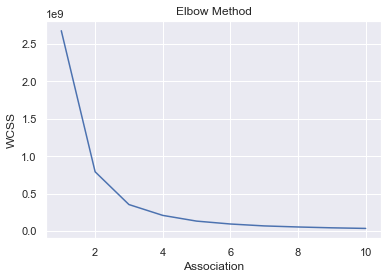

In [105]:
# select the optimal number of clusters: 4
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',
                    max_iter = 400, n_init = 10, random_state = SEED)
    kmeans.fit(rmf[['recency']])
    wcss.append(kmeans.inertia_)
    
# plot a line graph to observe 'The elbow'
sns.set()
sns.lineplot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Association')
plt.ylabel('WCSS')
plt.show()

In [104]:
# cluster by recency
kmeans = KMeans(n_clusters = 4, random_state = SEED)
kmeans.fit(rmf[['recency']])
rmf['recency_cluster'] = kmeans.predict(rmf[['recency']])

In [110]:
# in order to make cluster ordinal, we need to reorder the cluster number based on each cluster's average recency
def order_cluster(col, cluster_col, ascending):
    df = rmf.groupby(cluster_col)[col].mean().reset_index()
    df = df.sort_values(by=col, ascending=ascending).reset_index(drop=True)
    df['new_cluster'] = df.index
    reorder_dict = dict(zip(df[cluster_col], df.new_cluster))
    return reorder_dict

reordered_recency = order_cluster('recency', 'recency_cluster', False)
rmf['recency_rank'] = rmf.recency_cluster.map(reordered_recency)

In [112]:
# check the clustering
rmf.groupby('recency_rank').recency.describe()

,count,mean,std,min,25%,50%,75%,max
recency_rank,,,,,,,,
0,20270.0,483.438629,59.065853,399.0,436.0,475.0,526.0,694.0
1,30240.0,313.725198,43.357556,248.0,276.0,307.0,350.0,398.0
2,33145.0,182.777885,34.967934,123.0,153.0,182.0,213.0,247.0
3,31380.0,62.023996,35.931178,0.0,29.0,62.0,95.0,122.0


### Revenue

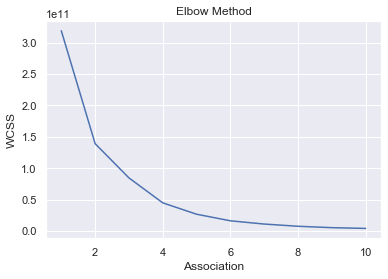

In [82]:
# select the optimal number of clusters: 4
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',
                    max_iter = 400, n_init = 10, random_state = SEED)
    kmeans.fit(rmf[['revenue']])
    wcss.append(kmeans.inertia_)
    
# plot a line graph to observe 'The elbow'
sns.lineplot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Association')
plt.ylabel('WCSS')
plt.show()

In [113]:
# cluster by revenue
kmeans = KMeans(n_clusters = 4, random_state = SEED)
kmeans.fit(rmf[['revenue']])
rmf['revenue_cluster'] = kmeans.predict(rmf[['revenue']])

In [116]:
reordered_revenue = order_cluster('revenue', 'revenue_cluster', True)
rmf['revenue_rank'] = rmf.revenue_cluster.map(reordered_revenue)

In [117]:
# check the clustering
rmf.groupby('revenue_rank').revenue.describe()

,count,mean,std,min,25%,50%,75%,max
revenue_rank,,,,,,,,
0,113765.0,265.353232,404.554818,9.59,69.63,131.75,267.36,3763.12
1,1153.0,7300.232255,3964.776886,3790.88,4415.96,5875.56,8425.44,19457.04
2,109.0,33880.448716,8751.759866,22346.60,27935.46,30186.00,44048.00,45256.00
3,8.0,109312.640000,0.000000,109312.64,109312.64,109312.64,109312.64,109312.64


### Frequency

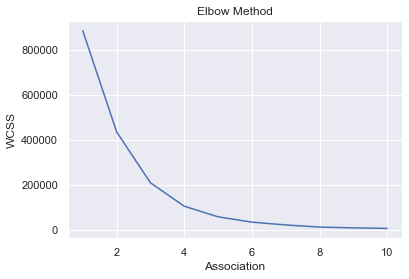

In [83]:
# select the optimal number of clusters: 4
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',
                    max_iter = 400, n_init = 10, random_state = SEED)
    kmeans.fit(rmf[['frequency']])
    wcss.append(kmeans.inertia_)
    
# plot a line graph to observe 'The elbow'
sns.lineplot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Association')
plt.ylabel('WCSS')
plt.show()

In [118]:
# cluster by frequency
kmeans = KMeans(n_clusters = 4, random_state = SEED)
kmeans.fit(rmf[['frequency']])
rmf['frequency_cluster'] = kmeans.predict(rmf[['frequency']])

In [119]:
reordered_frequency = order_cluster('frequency', 'frequency_cluster', True)
rmf['frequency_rank'] = rmf.frequency_cluster.map(reordered_frequency)

In [121]:
# check the clustering
rmf.groupby('frequency_rank').frequency.describe()

,count,mean,std,min,25%,50%,75%,max
frequency_rank,,,,,,,,
0,105897.0,1.304919,0.565831,1.0,1.0,1.0,2.0,3.0
1,8092.0,5.359614,1.724346,4.0,4.0,5.0,6.0,11.0
2,971.0,17.817714,6.890359,12.0,12.0,15.0,21.0,38.0
3,75.0,75.000000,0.000000,75.0,75.0,75.0,75.0,75.0


### Customer Value

In [122]:
# create an overall score
rmf['customer_value'] = rmf.recency_rank + rmf.revenue_rank + rmf.frequency_rank

In [126]:
rmf.groupby('customer_value')['recency', 'revenue', 'frequency'].agg(['count', 'mean'])

recency             revenue               frequency           
                 count        mean   count          mean     count       mean
customer_value                                                               
0                18585  482.930643   18585    203.861326     18585   1.288189
1                29110  321.955582   29110    250.584933     29110   1.501134
2                32822  193.198891   32822    271.831134     32822   1.647310
3                31258   72.848423   31258    337.860393     31258   1.700813
4                 2603   99.893584    2603   2185.550834      2603   8.308490
5                  582   98.661512     582   8286.669141       582  11.381443
6                   51  141.686275      51  27923.434314        51  15.392157
7                   24   21.000000      24  27935.460000        24  24.000000

In [127]:
# create the value rank: 0-2 -> low, 3-4 -> medium, 5-7 -> high
rmf['value_rank'] = rmf.customer_value.apply(lambda x: 0 if x in range(3) else (1 if x in range(3, 5) else 2))

In [136]:
# visualize the customer segments: plotly
fig = px.scatter_3d(rmf, x='recency', y='revenue', z='frequency', color='value_rank', opacity=0.5, size_max=5)
fig.show()

In [138]:
# save to csv
rmf.to_csv('csv/rmf.csv', index=False)